# Creating polygons and extracting values within those polygons
This notebook is averaging in a circle around a point, where there are about 800 points in a data frame.

## The data
See the `01-load-data.ipynb` for how the netCDF file was downloaded. The nc file was saved and is just loaded here.

In [1]:
# This is stored from load_data.ipynb file so run that first
%store -r ds

# Reproject to Winkel Tripel
See the `03-reproject-data.ipynb` file for discussion of reprojecting the SST rasters.

In [3]:
import rioxarray
import rasterio
import hvplot.xarray
import xarray as xr

In [4]:
# Assign the latlon projection
sst_da = ds.analysed_sst.rio.write_crs("+proj=longlat +datum=WGS84 +no_defs")

In [5]:
wintri_crs = '+proj=wintri +lon_0=0 +lat_1=0 +x_0=0 +y_0=0 +datum=WGS84 +units=km +no_defs'

In [6]:
sst_da_reproj = sst_da.rio.reproject(wintri_crs)

# Read in sample coordinates
The sample data points are in a file `sample_point_pairs_trim.csv`. The columns with `km` are points in the Winkel Tripel projection. Those are the ones we want.

In [7]:
import pandas as pd
import hvplot.pandas

In [8]:
df = pd.read_csv('../data/sample_point_pairs_trim.csv')

In [85]:
df.head(2)

,x.km.ns,y.km.ns,x.km.os,y.km.os,lon.ns,lat.ns,lon.os,lat.os
0,-14655.998881,6958.759684,-14782.212703,7186.052086,-165.064195,54.796769,-169.532303,56.432301
1,-14559.290840,6983.916333,-14645.481488,7244.629284,-164.339549,55.107237,-168.859906,57.062515


The `ns` columns are the nearshore points. The `km` columns are already in Winkel Tripel projection.

In [9]:
sst_da_reproj.hvplot(x='x', y='y') * df.hvplot.points(x='x.km.ns', y='y.km.ns', color="red", size=1)


:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [x,y]   (analysed_sst)
      .Points.I :Points   [x.km.ns,y.km.ns]

# Create the circle polygon

In [19]:
import geopandas

Step 1. Create a geodateframe with a geometry column that is the points in Wintri Tripel crs.

In [20]:
gdf = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df['x.km.ns'], df['y.km.ns']))
gdf = gdf_ns.set_crs(wintri_crs, allow_override=True)

<AxesSubplot:>

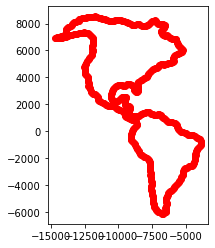

In [21]:
gdf.plot(color='red')

In [23]:
gdf.head(2)

,x.km.ns,y.km.ns,x.km.os,y.km.os,lon.ns,lat.ns,lon.os,lat.os,geometry
0,-14655.998881,6958.759684,-14782.212703,7186.052086,-165.064195,54.796769,-169.532303,56.432301,POINT (-14655.999 6958.760)
1,-14559.290840,6983.916333,-14645.481488,7244.629284,-164.339549,55.107237,-168.859906,57.062515,POINT (-14559.291 6983.916)


Not sure why this is needed.

In [25]:
gdf_reproj = gdf.to_crs("+proj=wintri +lon_0=0 +lat_1=0 +x_0=0 +y_0=0 +datum=WGS84 +units=km +no_defs")

Now I create a 50km buffer geometry, which is a circle around the point.

gdf_reproj['geometry'] = gdf_reproj.geometry.buffer(50)

Now we see that geometry is a polygon.

In [28]:
gdf_reproj['geometry'].head(2)

0    POLYGON ((-14605.999 6958.760, -14606.240 6953...
1    POLYGON ((-14509.291 6983.916, -14509.532 6979...
Name: geometry, dtype: geometry

In [33]:
clipped = sst_da_reproj.rio.clip(gdf_reproj.geometry.values, gdf_reproj.crs)

Now we have a clipped SST image where we have just the circles around each nearshore point.

In [34]:
clipped.hvplot.image()

:DynamicMap   [time]
   :Image   [x,y]   (analysed_sst)

Let's extract a single polygon.

In [41]:
sst_da_reproj.rio.clip(gdf_reproj.geometry.iloc[[0]], gdf_reproj.crs).hvplot.image()

:DynamicMap   [time]
   :Image   [x,y]   (analysed_sst)

Let's get the mean in that polygon.

In [43]:
sst_da_reproj.rio.clip(gdf_reproj.geometry[[0]], gdf_reproj.crs).mean()

<xarray.DataArray 'analysed_sst' ()>
array(278.32022, dtype=float32)
Coordinates:
    spatial_ref  int64 0

Now we can use a for loop to get all the means and add that to the original dataframe.

In [45]:
def geom_mean(geodf):
    return sst_da_reproj.rio.clip(geodf).mean()
means = []
for k, v in gdf_reproj.iterrows(): 
    #print(k)
    sst_mean = sst_da_reproj.rio.clip(gdf_reproj.geometry.iloc[[k]], gdf_reproj.crs).mean().values
    #print(f'{k} - {sst_mean}')
    means.append(sst_mean)
df['sst_mean'] = means

Make a function for this.

In [46]:
def geom_mean(geodf):
    return sst_da_reproj.rio.clip(geodf).mean()
def getsstmeans(ras, gdf):
    means = []
    for k, v in gdf.iterrows(): 
        ras_mean = ras.rio.clip(gdf.geometry.iloc[[k]], gdf.crs).mean().values
        means.append(ras_mean)
    return(means)

In [47]:
%timeit df['sst_mean_ns'] = getsstmeans(sst_da_reproj, gdf_reproj)

44.9 s ± 1.37 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


That is just for the nearshore points and I also need the offshore points. That would be 90 seconds per raster. That would take a long time for the whole data set of 10,000 or so rasters. Approximately 11 days.

In [50]:
365*30*90/(60*60*24)

11.40625